In [1]:
import json
import math
from datetime import timedelta

import geopandas as gpd
import numpy as np
import shapely
from matplotlib import pyplot as plt
from owslib.wms import WebMapService

import sentinelhub
from sentinelhub import CRS, BBox, Geometry, SentinelHubCatalog, SHConfig, WmsRequest, parse_time
from sentinelhub.api.statistical import SentinelHubStatistical
from sentinelhub.constants import RequestType
from sentinelhub.data_collections import DataCollection
from sentinelhub.data_utils import statistical_to_dataframe
from sentinelhub.download.sentinelhub_statistical_client import SentinelHubStatisticalDownloadClient

This notebook is a demonstrator for the **Climate Change Monitoring & CAP Compliance Toolbox (D4.1)**, developed within the AgriDataValue project. It specifically showcases the toolbox's capabilities in retrieving, processing, and visualizing climate projection indicators. 

It showcases the retrieval of both 5-year projection indicators and long-term projection indicators, visualizing the data and associated statistics for a comprehensive overview of climate change impacts on the selected area. This aligns with the D4.1 objective of showcasing indicators derived from various data sources, accessible in a unified manner through the toolbox.

# Utility functions 

In [2]:
def list_sentinelhub_configurations(config: SHConfig, collection_id: str) -> list[dict]:
    """
    List all configurations for a given collection.
    Args:
        config: SHConfig
        collection_id: str, BYOC collection ID for which the configurations are listed
    Returns:
        list: list of configurations
    """
    session = sentinelhub.SentinelHubSession(config=config)

    coll_id = collection_id.removeprefix("byoc-")
    request = sentinelhub.base.DownloadRequest(
        url=f"https://sh.dataspace.copernicus.eu/api/v2/configuration/instances?collectionId={coll_id}",
        request_type=RequestType.GET,
        use_session=True,
        headers={"content-type": "application/json;charset=utf-8"},
    )

    client = sentinelhub.SentinelHubDownloadClient(session=session)
    response = client.download([request], decode_data=False)[0]

    return json.loads(response.content.decode())

In [ ]:
config = SHConfig(profile="adv-demonstrator")
config.sh_base_url = "https://sh.dataspace.copernicus.eu"
config.sh_token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
catalog = SentinelHubCatalog(config=config)

# Get data 

In [4]:
aoi = (
    "MultiPolygon (((0.1934735202856874 41.862204100840259, 0.19333435235317373 41.86232299456581529,"
    " 0.19315790762176849 41.86259731511638904, 0.19298299844768915 41.86289706896998553, 0.19295955268427448"
    " 41.86293729124536611, 0.19277459943110034 41.86311693340326912, 0.19248146053032858 41.86331293061823544,"
    " 0.19224552512116022 41.86361407662933942, 0.19167708305901338 41.86416005088052827, 0.19156862441108211"
    " 41.864292932231983, 0.1915556423699234 41.86431701993191012, 0.19244601563971245 41.86478071044896154,"
    " 0.19318950678740796 41.86516272243473225, 0.19413785935672059 41.86564844096591287, 0.1943324079461429"
    " 41.8657536108882482, 0.19467035020663967 41.86539822298133373, 0.19504600002092923 41.86510048700640141,"
    " 0.196420565144315 41.86462254842476938, 0.19641080710075226 41.86476306891898247, 0.1963938683553236"
    " 41.86500733960439646, 0.19645959948316721 41.86483486549386868, 0.19664023590428159 41.86470149123041296,"
    " 0.1968753271905421 41.8646564372390273, 0.19698112797444467 41.864680725188542, 0.19707678102340495"
    " 41.86469738052667111, 0.19757055723744343 41.86451383604557464, 0.19590581728178671 41.86360912045829963,"
    " 0.19441975175372272 41.86276408904257806, 0.1934735202856874 41.862204100840259)))"
)

In [5]:
aoi = shapely.wkt.loads(aoi)

In [6]:
collections = catalog.get_collections()
collections = sorted(
    [collection for collection in collections if collection["id"].startswith("byoc")], key=lambda x: x["title"]
)

In [7]:
print("The following BYOC collections are available:")
for collection in collections:
    print(f"- {collection['title']} ({collection['id']})")

The following BYOC collections are available:
- 5 year projection indicator - Daily maximum near-surface air temperature (byoc-c338f78f-5d6d-4fca-bcf4-dbb5e14445ce)
- 5 year projection indicator - Daily minimum near-surface air temperature (byoc-0048de7c-41cc-47d2-921a-b0d6ff92fc87)
- 5 year projection indicator - Daily near-surface air temperature (byoc-3998c981-b733-45e7-a67e-2f44c3bf3d03)
- 5 year projection indicator - Daily-mean near-surface wind speed (byoc-10f4ef9d-626c-4bfb-9d46-02a93318c5b6)
- 5 year projection indicator - Near-surface relative humidity (byoc-fb5bec13-2de2-4ad3-a478-41c2106a519e)
- 5 year projection indicator - Near-surface specific humidity (byoc-7913e91a-586d-4a6e-ac83-e2a6303dd792)
- 5 year projection indicator - Precipitation (byoc-67d59500-44bf-4d55-8755-706dd91dbc91)
- 5 year projection indicator - Surface downwelling longwave radiation (byoc-fd491afa-d736-4e74-a0cd-2045ffc339be)
- 5 year projection indicator - Surface downwelling shortwave radiation (by

In [8]:
def plot_parcel_stats(df, ssp, ax, **plot_kwargs):
    ssp_band_cols = [x for x in df.columns if x.startswith("bands") and f"ssp_{ssp}" in x and x.endswith("mean")]
    df = df[ssp_band_cols + ["collection"]].rename(columns={x: " ".join(x.split("_")[1:3]) for x in ssp_band_cols})
    df.melt(id_vars=["collection"]).plot(x="variable", y="value", ax=ax, **plot_kwargs)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
    ax.set_title(df.iloc[0]["collection"])

In [9]:
def construct_evalscript(bands):
    bands_output = str(bands).replace("'", '"')
    bands_input = str(bands + ["dataMask"]).replace("'", '"')
    bands_str_samples = str([f"samples.{x}" for x in bands]).replace("'", "")

    rgb_evalscript = f"""
//VERSION=3

function setup() {{
  return {{
    input: [
      {{
        bands: {bands_input}
      }}
    ],
    output: [
      {{
        id: "bands",
        bands: {bands_output},
        sampleType: SampleType.FLOAT32
      }},
      {{
        id: "dataMask",
        bands: 1
      }}
    ]
  }}
}}

function evaluatePixel(samples) {{
    return {{
      bands: {bands_str_samples},
      dataMask: [samples.dataMask]
    }};
}}
"""
    return rgb_evalscript

In [10]:
def collection_statistics(collection, pilot_geom):
    band_names = [x["name"] for x in collection["summaries"]["eo:bands"]]
    title = collection["title"]

    byoc_collection = DataCollection.define_byoc(collection["id"][5:])
    bands_evalscript = construct_evalscript(band_names)

    collection_requests = []

    lon, lat = pilot_geom.centroid.x, pilot_geom.centroid.y
    utm_crs = CRS.get_utm_from_wgs84(lon, lat)

    transform_function = CRS.WGS84.get_transform_function(utm_crs, always_xy=True)
    geometry = shapely.ops.transform(transform_function, pilot_geom)
    if geometry.area == 0:
        geometry = geometry.buffer(20)

    geom_utm = Geometry(geometry, utm_crs)
    interval_start, interval_end = collection["extent"]["temporal"]["interval"][0]

    interval_start = parse_time(interval_start)
    interval_end = interval_start + timedelta(days=1)

    request = SentinelHubStatistical(
        aggregation=SentinelHubStatistical.aggregation(
            evalscript=bands_evalscript,
            time_interval=(interval_start, interval_end),  # TODO
            aggregation_interval="P1D",
            resolution=(10, 10),
        ),
        input_data=[SentinelHubStatistical.input_data(byoc_collection)],
        geometry=geom_utm,
        config=config,
        data_folder="./data",
    )
    collection_requests.append(request)

    download_requests = [coll_request.download_list[0] for coll_request in collection_requests]
    client = SentinelHubStatisticalDownloadClient(config=config)
    collection_stats = client.download(download_requests)
    stats = statistical_to_dataframe(collection_stats)
    band_mean_cols = [x for x in stats.columns if x.startswith("bands_") and x.endswith("mean")]
    stats = stats[band_mean_cols]
    stats["collection"] = title
    return stats

# 5 year projection indicators 


This section demonstrates the retrieval and visualization of 5-year climate projection indicators. These indicators provide short to medium-term climate projections that are essential for:

- Agricultural planning and crop management decisions
- Climate adaptation strategies  
- Risk assessment and mitigation planning

The analysis includes:
- Statistical data extraction for the selected area of interest
- Comparison between different SSP scenarios (SSP 4.5 and SSP 8.5)
- Visual representation of both statistical trends and spatial data

**SSP Scenarios:**
- **SSP 4.5**: Intermediate greenhouse gas concentration trajectory
- **SSP 8.5**: High greenhouse gas concentration trajectory


In [11]:
selected_collections = [c for c in collections if c["title"].startswith("5 year projection")]

In [12]:
stats = [collection_statistics(c, aoi) for c in selected_collections]

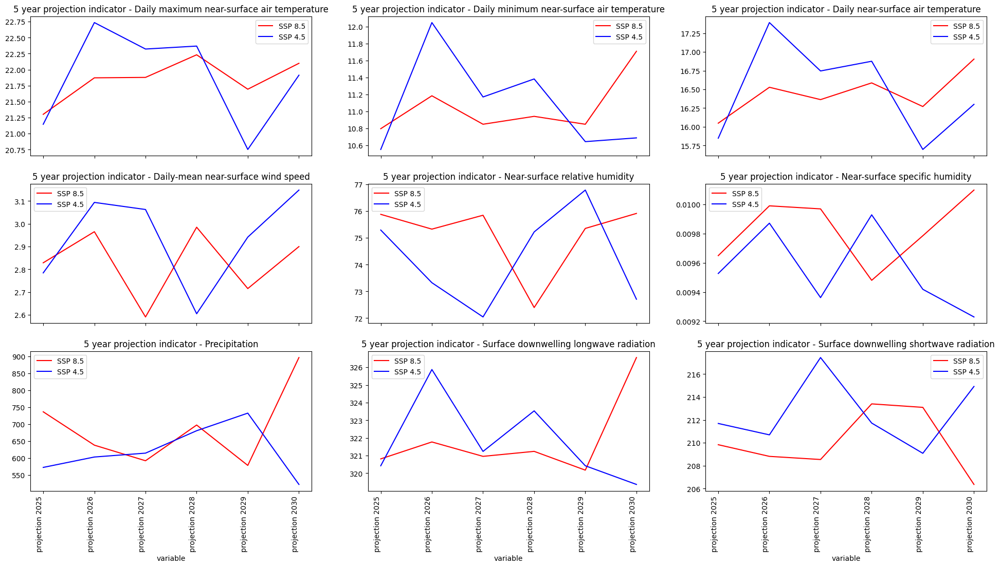

In [13]:
ncols = 3
nrows = math.ceil(len(stats) / ncols)
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8 * ncols, 4 * nrows), sharex=True)
for ax, s in zip(axs.flatten(), stats):
    plot_parcel_stats(s, "85", ax, label="SSP 8.5", color="red")
    plot_parcel_stats(s, "45", ax, label="SSP 4.5", color="blue")

# Visualize the data from the layer

This section demonstrates the visualization of climate projection data through both statistical analysis and spatial mapping. 

- **Statistical Plots**: Comparative analysis between SSP 4.5 and SSP 8.5 scenarios showing climate indicator trends
- **Spatial Visualization**: High-resolution maps displaying the spatial distribution of climate indicators across the area of interest
- **Interactive Zoom Views**: Detailed inset views of the parcel location within the broader geographical context
- **Multi-scenario Comparison**: Side-by-side visualization of different climate scenarios

The visualization framework integrates both statistical summaries and georeferenced imagery to provide a complete picture of climate projection impacts, enabling stakeholders to understand both the magnitude and spatial patterns of projected climate changes and serves as a demonstrator of toolbox capabilties. 

In [14]:
def plot_image(image, bbox, ax, factor=1):
    """
    Utility function for plotting RGB images.
    """

    if np.issubdtype(image.dtype, np.floating):
        ax.imshow(np.minimum(image * factor, 1), extent=np.array(bbox.geometry.bounds[[0, 2, 1, 3]]))
    else:
        ax.imshow(image, extent=np.array(bbox.geometry.bounds)[[0, 2, 1, 3]])


def plot_image_with_zoom(
    img: np.ndarray, img_buffered: np.ndarray, bbox: BBox, bbox_buffered: BBox, ax, gdf: gpd.GeoDataFrame
) -> None:
    """
    Utility function for plotting RGB images.
    """

    img_extent_buffered = np.array(bbox_buffered.geometry.bounds)[
        [0, 2, 1, 3]
    ]  # Using pixel coordinates for this example
    img_extent = np.array(bbox.geometry.bounds)[[0, 2, 1, 3]]  # Using pixel coordinates for this example

    parcel_polygon = gdf.geometry.iloc[0]
    minx, miny, maxx, maxy = parcel_polygon.bounds
    ax.imshow(img_buffered, extent=img_extent_buffered)
    ax.set_title("Image with Parcel Location (Far Away)")

    gdf.plot(ax=ax, facecolor="None", edgecolor="black", linewidth=1)
    # ax.plot(*parcel_polygon.exterior.xy, color='red', linewidth=2, label='Parcel')

    ylim_inset = (miny, maxy)

    axins = ax.inset_axes(
        [0.6, 0.6, 0.38, 0.38],  # [left, bottom, width, height] in parent axes coordinates
        xlim=(minx, maxx),
        ylim=ylim_inset,
        xticklabels=[],
        yticklabels=[],
    )

    axins.imshow(img, extent=img_extent)

    # Plot the polygon in the inset axes
    gdf.plot(ax=axins, facecolor="None", edgecolor="black", linewidth=2)
    ax.indicate_inset_zoom(axins, edgecolor="black", alpha=0.7, lw=1.5)

In [ ]:
def plot_image_with_statistics(statistics, collection, aoi, config):
    bbox = BBox(aoi.bounds, crs=CRS.WGS84)
    buffered_bbox = bbox.buffer(2000, relative=True)

    configuration = list_sentinelhub_configurations(config, collection["id"])[0]
    config.instance_id = configuration["id"]
    layers = list(WebMapService(f"https://sh.dataspace.copernicus.eu/ogc/wms/{configuration['id']}").contents.keys())

    layer_data = {}
    layer_data_buffered = {}

    for layer in layers:
        indicator_request_buffered = WmsRequest(
            data_collection=DataCollection.define_byoc(c["id"][5:]),
            layer=layer,
            bbox=buffered_bbox,
            width=1024,
            config=config,
        )
        indicator_request_original = WmsRequest(
            data_collection=DataCollection.define_byoc(c["id"][5:]), layer=layer, bbox=bbox, width=1024, config=config
        )

        indicator_data_buffered = indicator_request_buffered.get_data()
        indicator_data_original = indicator_request_original.get_data()
        layer_data[layer] = indicator_data_original
        layer_data_buffered[layer] = indicator_data_buffered

    ssp2_45_layers = [layer for layer in layer_data.keys() if "SSP2-45" in layer]
    ssp2_85_layers = [layer for layer in layer_data.keys() if "SSP2-85" in layer]

    fig = plt.figure(figsize=(35, 15))
    fig.suptitle(collection["title"], fontsize=25)

    num_image_cols = len(ssp2_45_layers)
    gs = fig.add_gridspec(3, len(ssp2_45_layers))

    axs_images = [[None for _ in range(num_image_cols)] for _ in range(2)]

    for i in range(num_image_cols):
        axs_images[0][i] = fig.add_subplot(gs[0, i])
        axs_images[1][i] = fig.add_subplot(gs[1, i], sharex=axs_images[0][i])

    ax_stats = fig.add_subplot(gs[2, :])  # Stats plot spans all columns in the third row

    gdf = gpd.GeoDataFrame(geometry=[aoi], crs=4326)

    for i, (ssp2_45_layer, ssp2_85_layer) in enumerate(zip(ssp2_45_layers, ssp2_85_layers)):
        plot_image_with_zoom(
            layer_data[ssp2_45_layer][0],
            layer_data_buffered[ssp2_45_layer][0],
            bbox,
            buffered_bbox,
            axs_images[0][i],
            gdf,
        )
        plot_image_with_zoom(
            layer_data[ssp2_85_layer][0],
            layer_data_buffered[ssp2_85_layer][0],
            bbox,
            buffered_bbox,
            axs_images[1][i],
            gdf,
        )

        axs_images[0][i].set_title(ssp2_45_layer)
        axs_images[0][i].axis("off")

        axs_images[1][i].set_title(ssp2_85_layer)
        axs_images[1][i].axis("off")

    plot_parcel_stats(statistics, "45", ax_stats, label="SSP 4.5", color="blue", marker="o", fontsize=20, linewidth=3)
    plot_parcel_stats(statistics, "85", ax_stats, label="SSP 8.5", color="red", marker="x", fontsize=20, linewidth=3)
    ax_stats.set_title(f"Statistics for {collection['title']}", fontsize=25)
    ax_stats.legend()

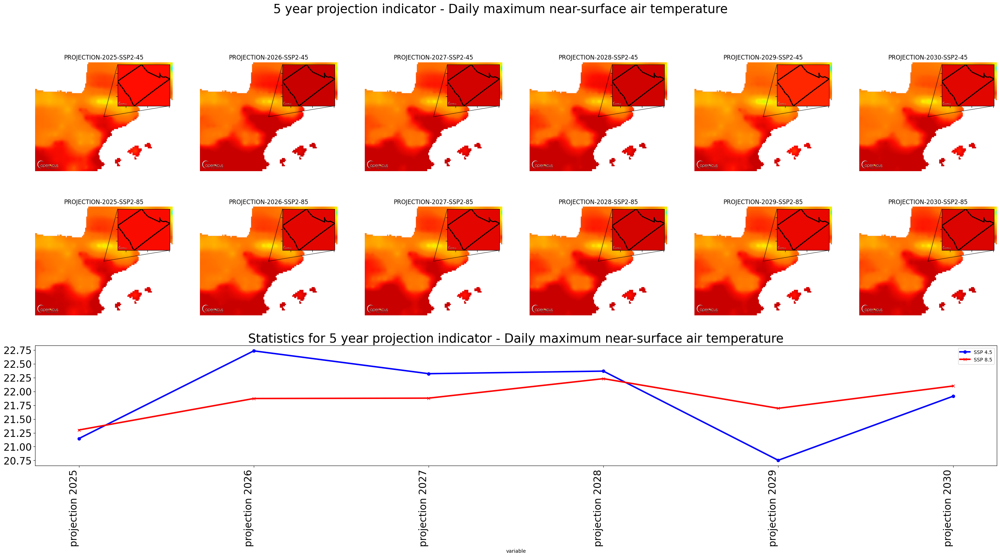

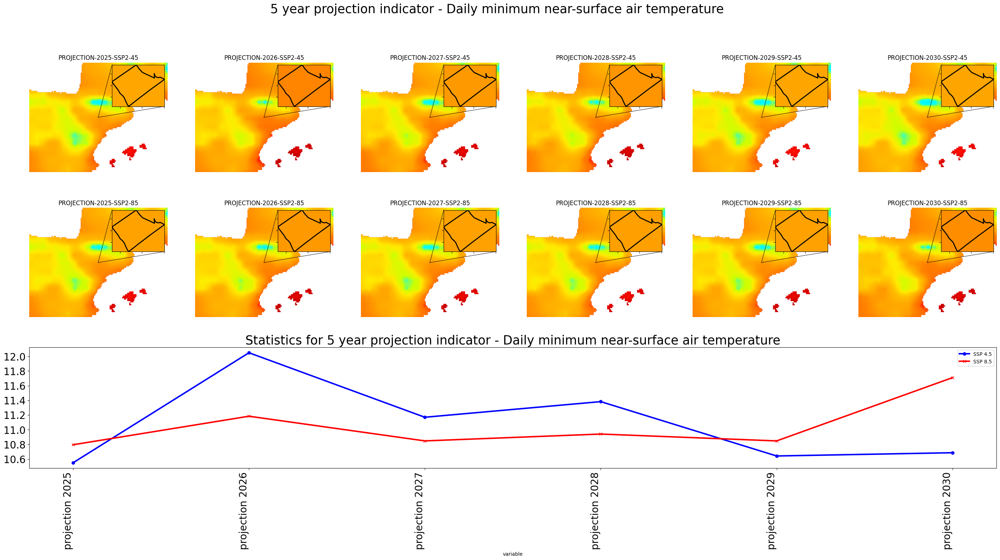

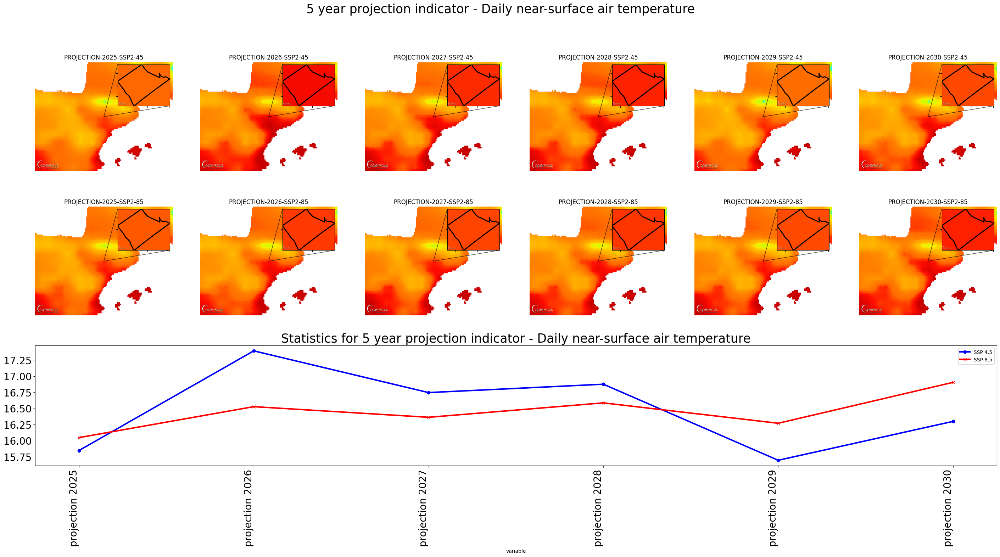

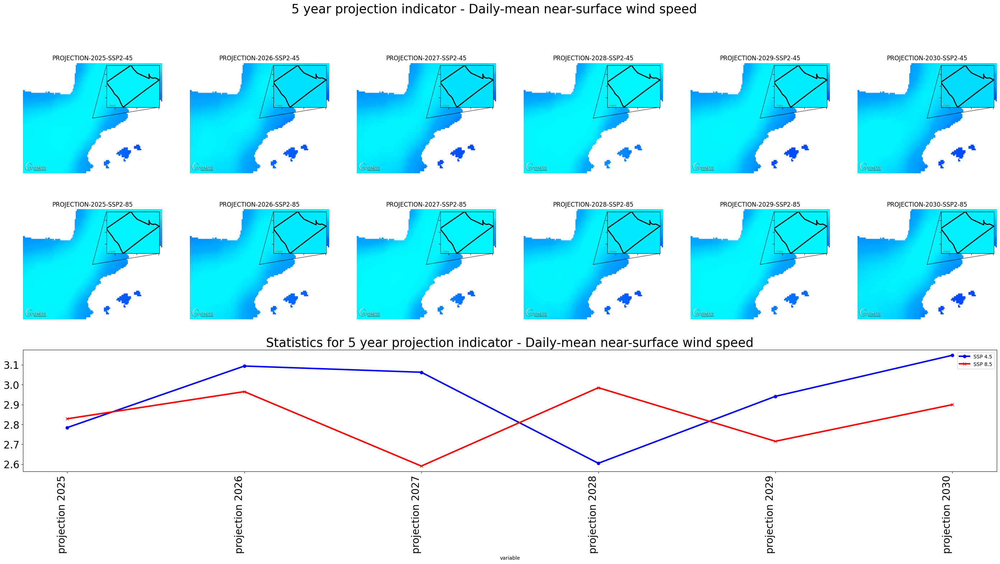

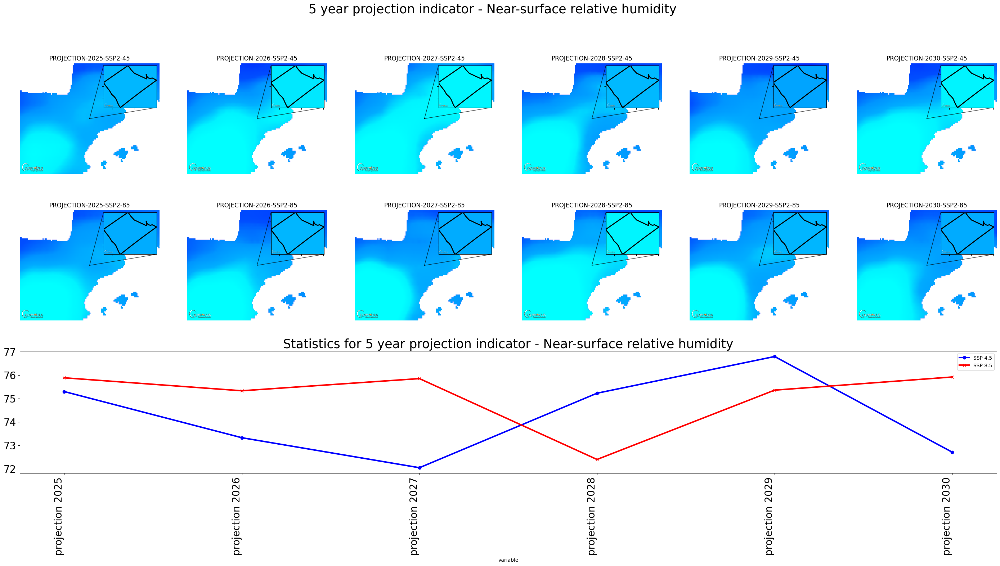

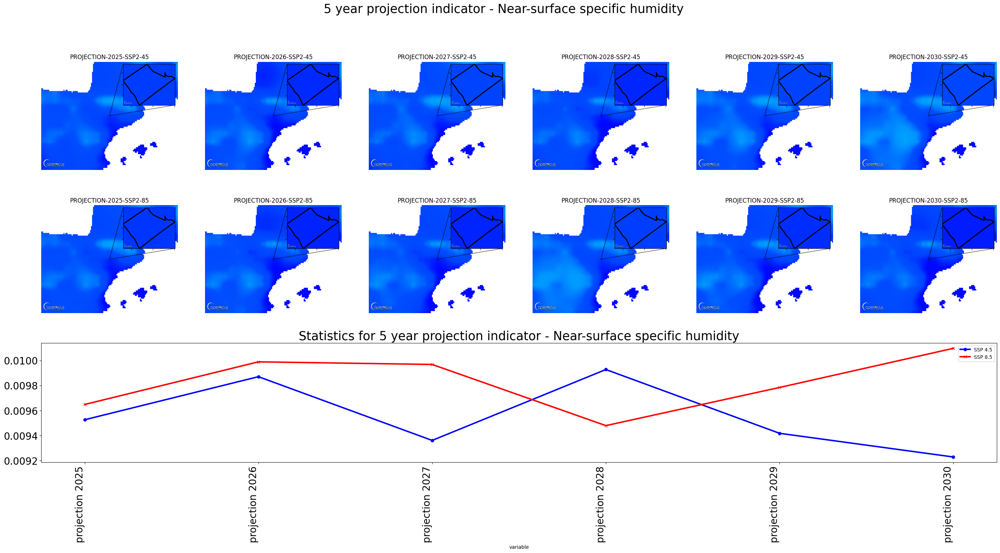

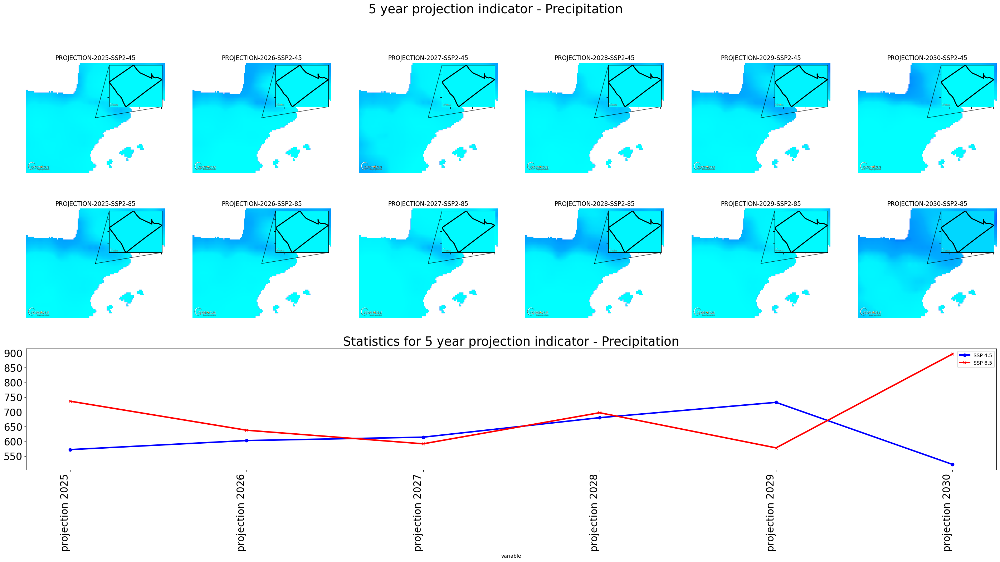

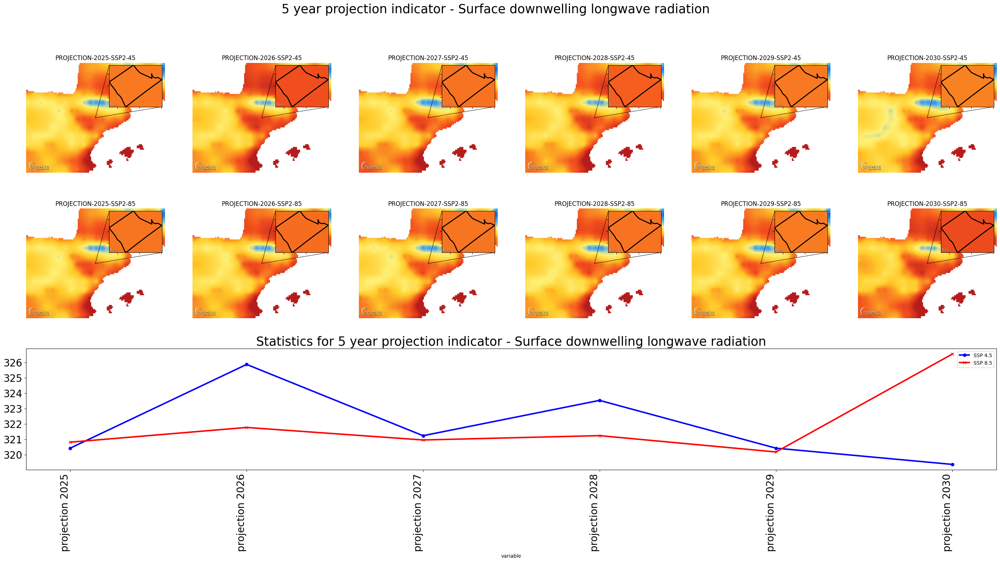

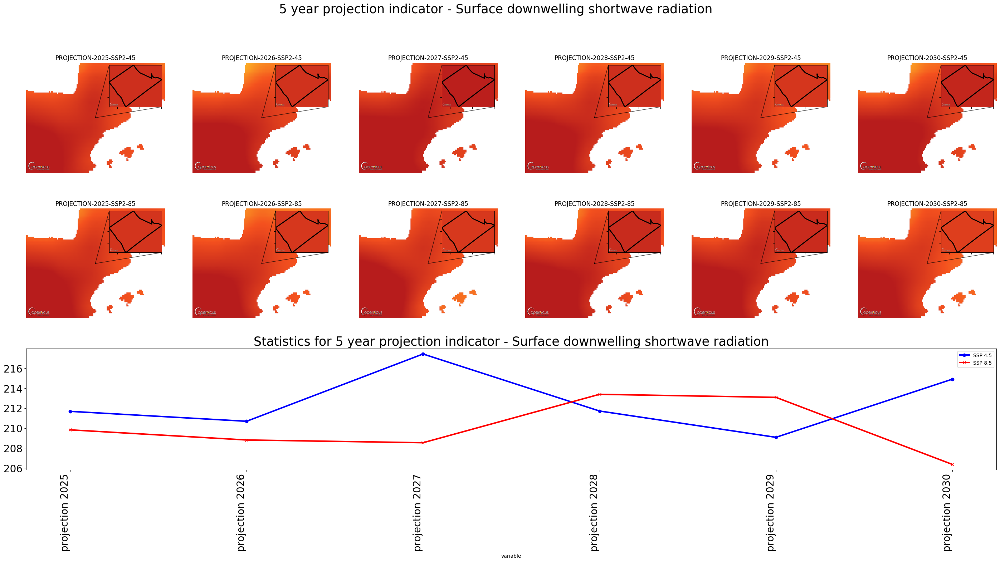

In [16]:
for s, c in zip(stats, selected_collections):
    plot_image_with_statistics(s, c, aoi, config)

# Long term projections

This section focuses on long-term climate projection indicators, extending the analysis beyond the 5-year timeframe to provide insights into:

- **Multi-decadal climate trends** spanning 20+ year periods
- **Strategic long-term planning** for agricultural infrastructure and land use decisions
- **Climate impact assessment** for policy development and environmental planning
- **Ecosystem adaptation planning** for sustained agricultural productivity

Long-term projections offer critical insights for understanding the trajectory of climate change impacts over extended periods, enabling stakeholders to make informed decisions about infrastructure investments with multi-decade lifespans, crop variety selection and breeding programs, water resource management strategies, regional climate adaptation policies and more. 

The analysis methodology mirrors the 5-year approach but focuses on longer temporal scales to capture gradual but significant climate shifts that may not be apparent in shorter projection windows.

In [17]:
long_term_projections_collections = [c for c in collections if c["title"].startswith("projection indicator")]
stats_ltr = [collection_statistics(c, aoi) for c in long_term_projections_collections]

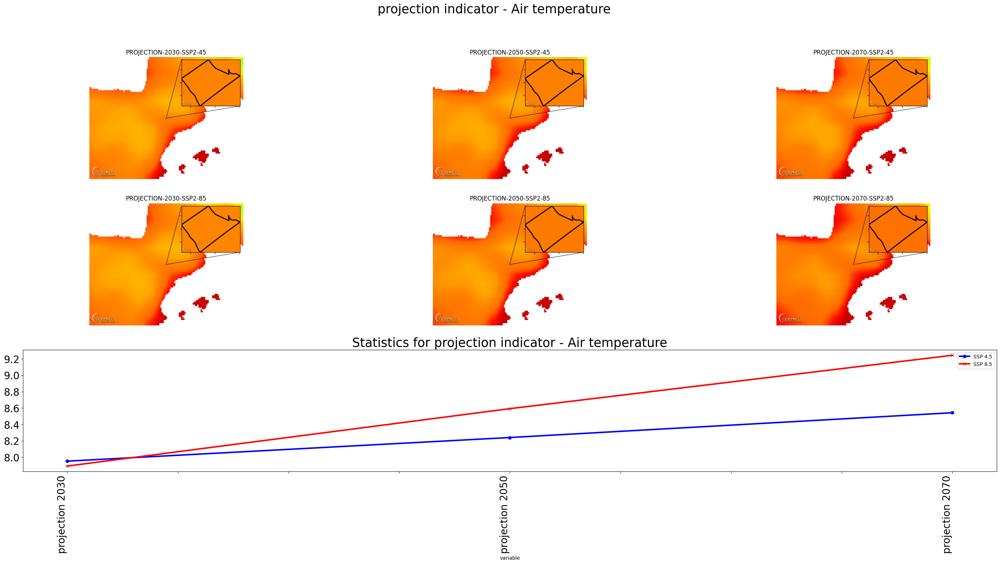

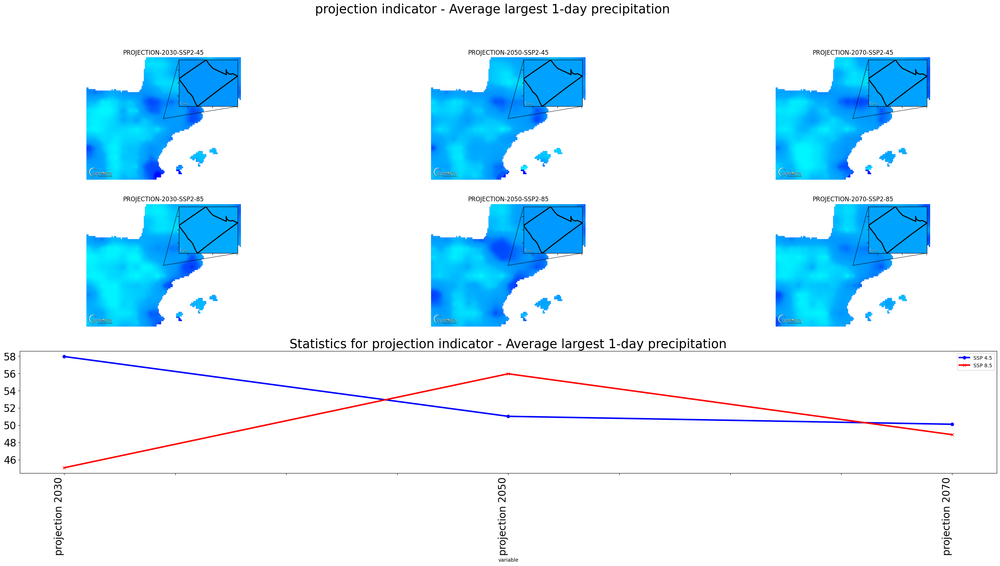

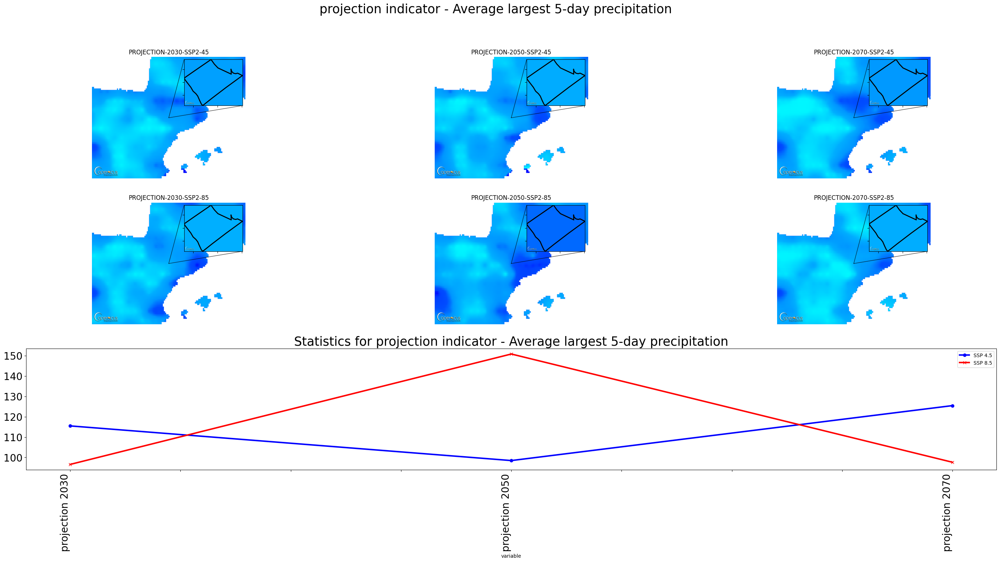

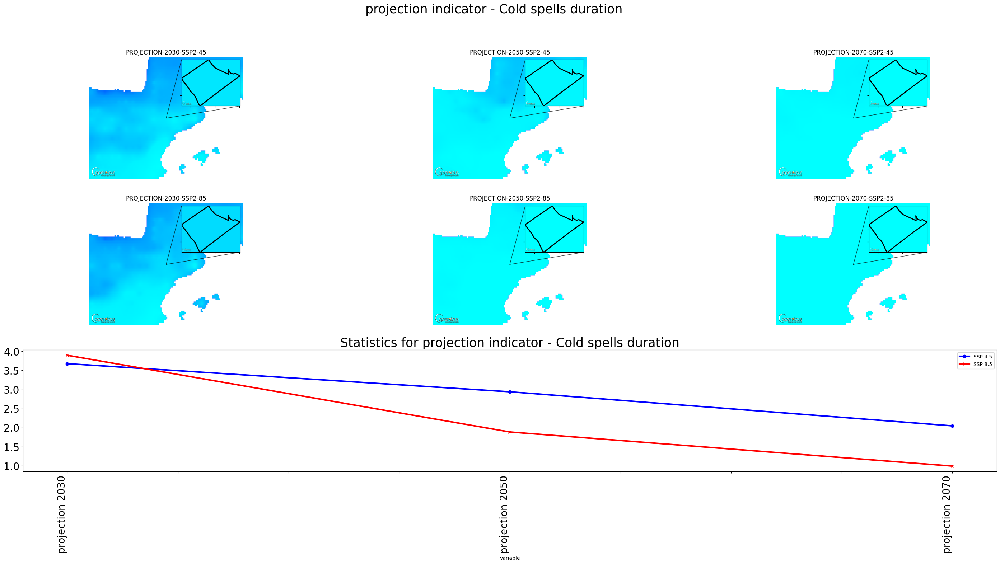

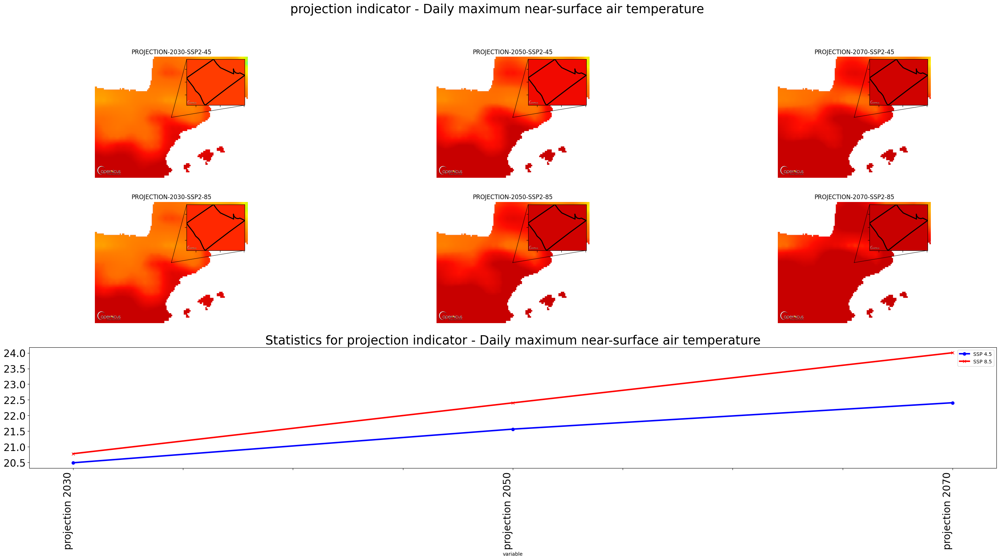

...

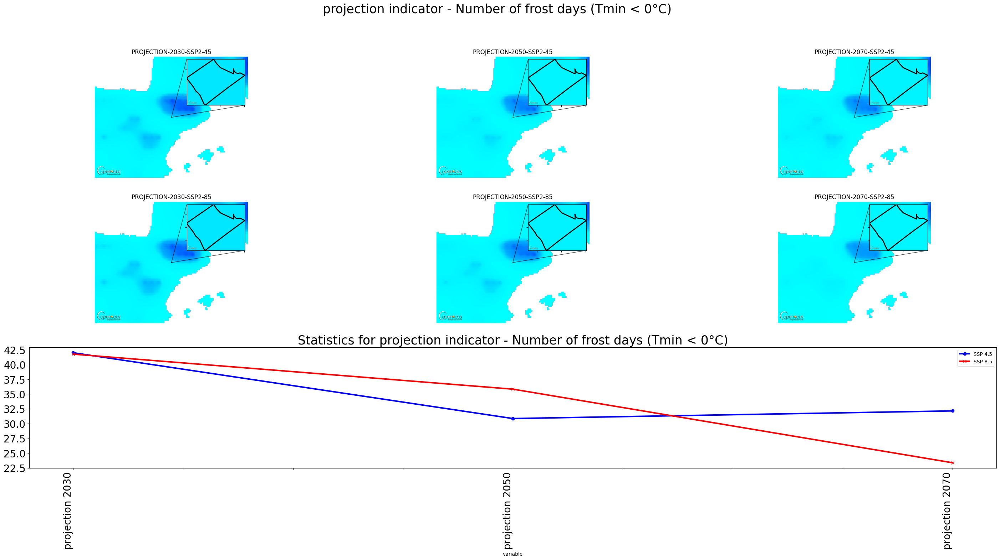

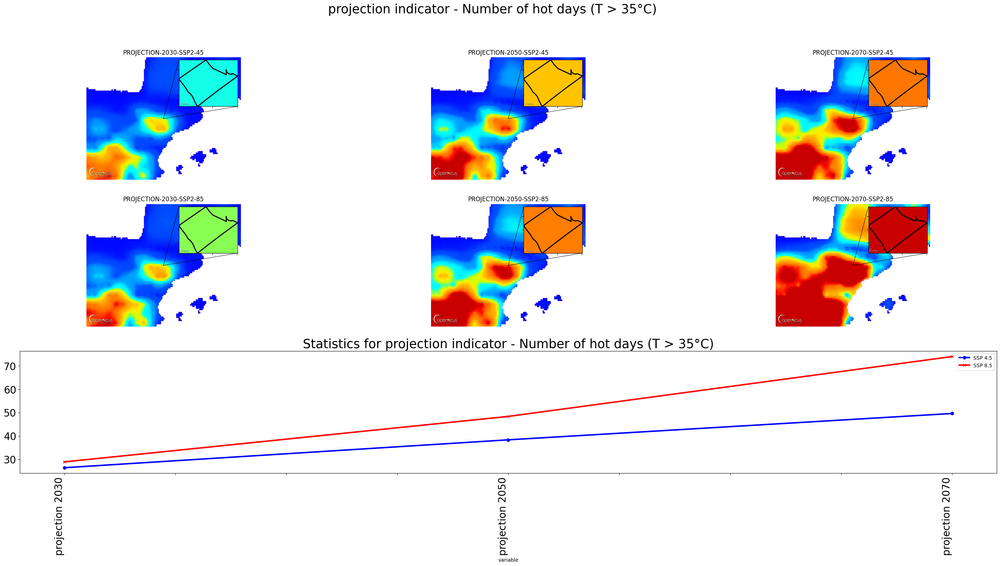

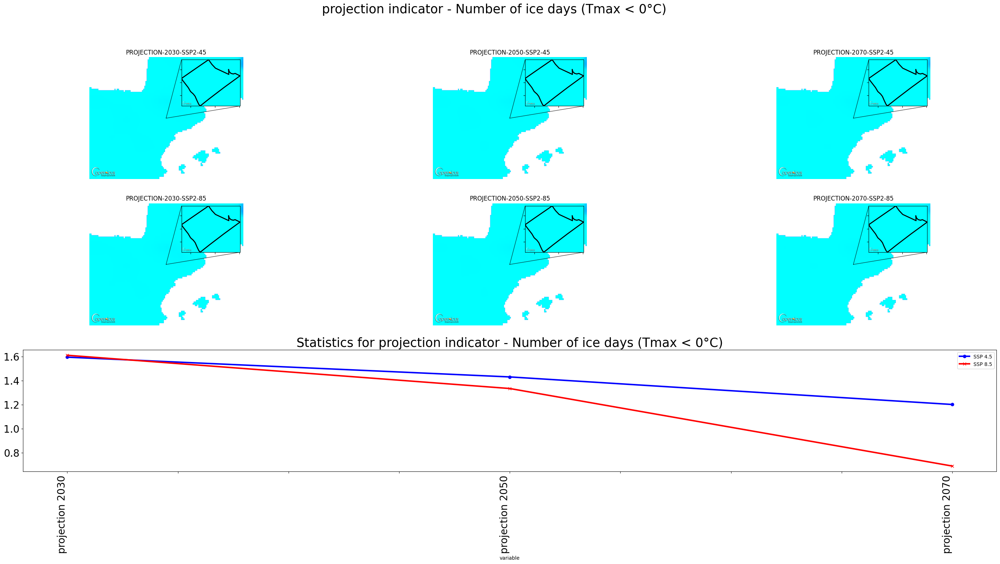

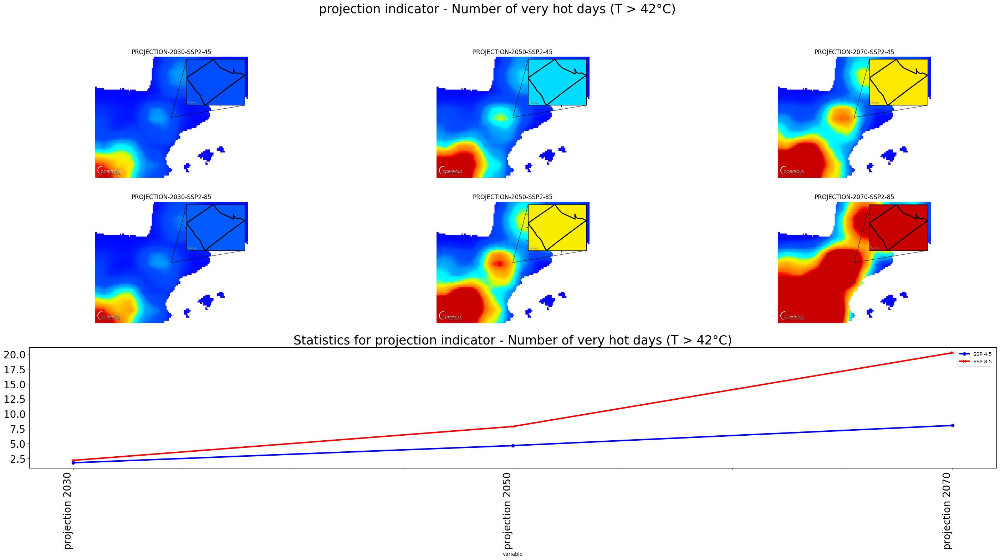

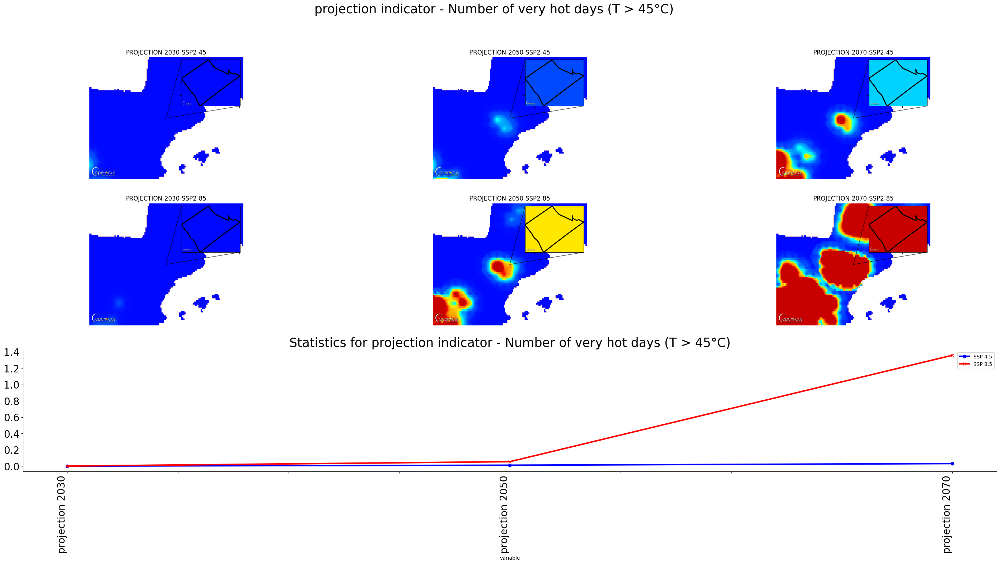

In [18]:
for s, c in zip(stats_ltr, long_term_projections_collections[:20]):
    plot_image_with_statistics(s, c, aoi, config)

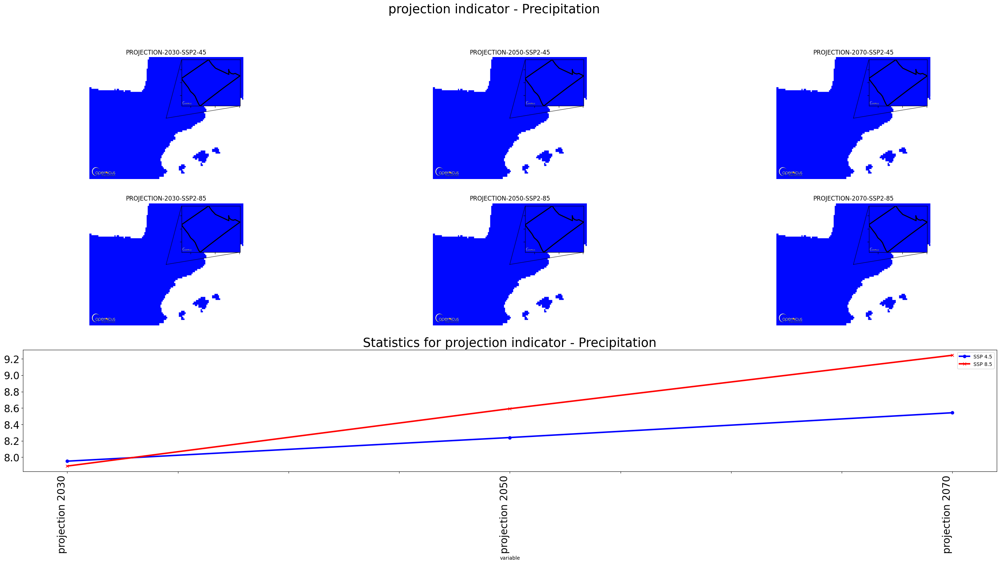

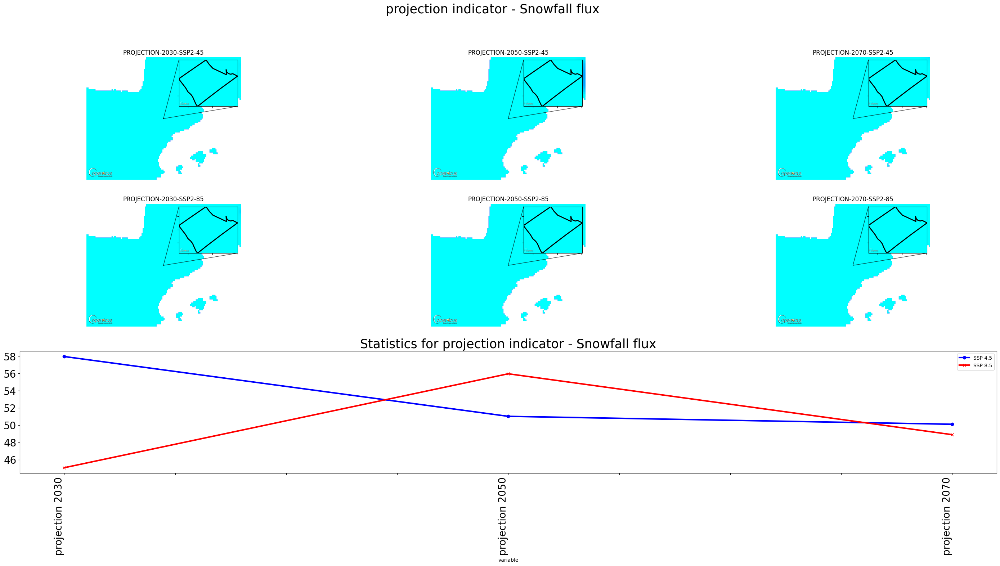

In [20]:
for s, c in zip(stats_ltr, long_term_projections_collections[20:]):
    plot_image_with_statistics(s, c, aoi, config)